# OOP Using Python -- III

## **Data Encapsulation**

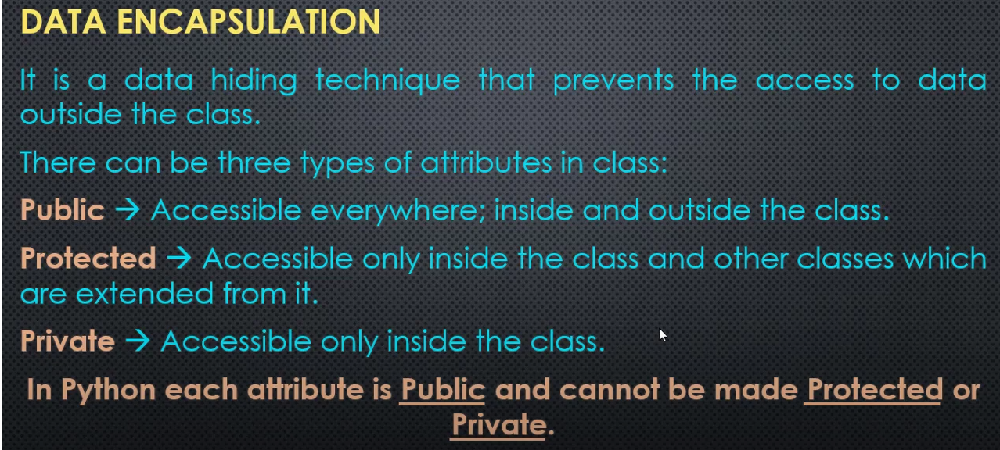

In [ ]:
import random

class Dice:
  def __init__(self):
    self.side_up = 1

  def roll(self):
    self.side_up = random.randint(1,6)

  def __str__(self):
    return str(self.side_up)


## Main program ##

my_dice = Dice()

for i in range(5):
  my_dice.roll()
  print(my_dice)

6
1
3
1
4


In [ ]:
## Main program ##

my_dice = Dice()

for i in range(5):
  my_dice.roll()
  my_dice.side_up = 6 # misuse of the roll method
  print(my_dice)

6
6
6
6
6


Two convensions in python.


*   single underscore (`_`) leading to the name of data or method attribute.
*   double leading underscores (`__`) with the attribute names



In [ ]:
import random

class Dice:
  def __init__(self):
    self._side_up = 1

  def roll(self):
    self._side_up = random.randint(1,6)

  def __str__(self):
    return str(self._side_up)


## Main program ##

my_dice = Dice()

for i in range(5):
  my_dice.roll()
  my_dice._side_up = 6
  print(my_dice)

6
6
6
6
6


In [ ]:
import random

class Dice:
  def __init__(self):
    self.__side_up = 1

  def roll(self):
    self.__side_up = random.randint(1,6)

  def __str__(self):
    return str(self.__side_up)


## Main program ##

my_dice = Dice()

for i in range(5):
  my_dice.roll()
  my_dice.__side_up = 6
  print(my_dice)

5
3
1
4
5


In [ ]:
import random

class Dice:
  def __init__(self):
    self.__side_up = 1

  def roll(self):
    self.__side_up = random.randint(1,6)

  def __str__(self):
    return str(self.__side_up)


## Main program ##

my_dice = Dice()

print(my_dice.__side_up) # it has a different name outside the class


AttributeError: 'Dice' object has no attribute '__side_up'

In [ ]:
import random

class Dice:
  def __init__(self):
    self.__side_up = 1

  def roll(self):
    self.__side_up = random.randint(1,6)

  def __str__(self):
    return str(self.__side_up)


## Main program ##

my_dice = Dice()

print(my_dice.__dict__)


{'_Dice__side_up': 1}


In [ ]:
import random

class Dice:
  def __init__(self):
    self.__side_up = 1

  def roll(self):
    self.__side_up = random.randint(1,6)

  def __str__(self):
    return str(self.__side_up)


## Main program ##

my_dice = Dice()

for i in range(5):
  my_dice.roll()
  my_dice._Dice__side_up = 6 # requires additional effort to access outside.
  print(my_dice)


6
6
6
6
6


## **Getters, Setters and Deleters**

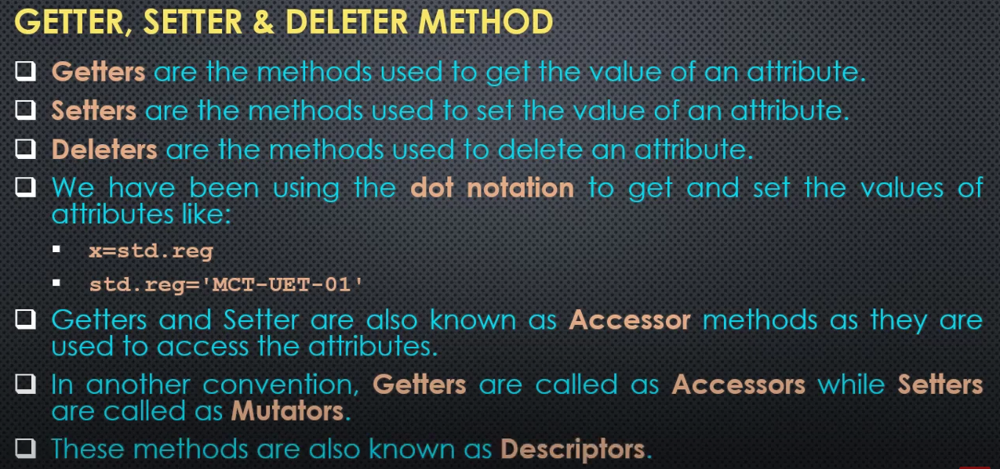

Two methods for Getters and setters.

Approach 1

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(getattr(stud1, "first_name"))
setattr(stud1,"first_name", "Ephrem")
print(getattr(stud1,"first_name"))

Solomon
Ephrem


In [ ]:
f_name = "first_name"
stud1.f_name # assumues f_name is the name of the attribute and raises error

AttributeError: 'Student' object has no attribute 'f_name'

Important when the attributes are obtained from other sources such as users input or external files

In [ ]:
f_name = "first_name"
print(getattr(stud1, f_name))
setattr(stud1,f_name, "Henok")
print(getattr(stud1, f_name))

Ephrem
Henok


We can add an attribute with default value.

In [ ]:
print(getattr(stud1, "university"))

AttributeError: 'Student' object has no attribute 'university'

In [ ]:
print(getattr(stud1, "university", "PKNU"))

PKNU


Approach 2

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name
  def set_fname(self, new_name):
    self.first_name = new_name

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    self.last_name = new_name

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.get_fname())
stud1.set_fname("Mohammed")
print(stud1.get_fname())

Solomon
Mohammed


Setters are good for constraints such as names should be alphabet characters without numbers.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name
  def set_fname(self, new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    self.last_name = new_name

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.get_fname())
stud1.set_fname("Mg45")
print(stud1.get_fname())

Solomon


ValueError: Name must be alphabets only, with atleast 2 characters.

We can do the same condition for the last name.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name
  def set_fname(self, new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      self.last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.get_fname())
stud1.set_fname("Mg45")
print(stud1.get_fname())

Solomon


ValueError: Name must be alphabets only, with atleast 2 characters.

However, having a duplicate logic is not a good idea. Rather we can use the static method in such situations for validity of a name.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name
  def set_fname(self, new_name):
    if Student.valid_name(new_name):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    if Student.valid_name(new_name):
      self.last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.get_fname())
stud1.set_lname("Mg45")
print(stud1.get_fname())

Solomon


ValueError: Name must be alphabets only, with atleast 2 characters.

There are no validity check for the `__init__` method.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name
  def set_fname(self, new_name):
    if Student.valid_name(new_name):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    if Student.valid_name(new_name):
      self.last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False


## Main Program ##
stud1 = Student("Solomon2", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.get_fname())


Solomon2


In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.set_fname(f_name)
    self.set_lname(l_name)
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name
  def set_fname(self, new_name):
    if Student.valid_name(new_name):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    if Student.valid_name(new_name):
      self.last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False


## Main Program ##
stud1 = Student("Solomon2", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.get_fname())


ValueError: Name must be alphabets only, with atleast 2 characters.

To use the dot notation for getting first and lat names

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.set_fname(f_name)
    self.set_lname(l_name)
    self.reg_num = r_num

  def get_fname(self):
    return self._first_name # In the tutorial, no underscore w/c results error here; tutorial discusses this problem in the next code.
  def set_fname(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name # In the tutorial, no underscore w/c results error here
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")
  first_name = property(get_fname, set_fname)

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    if Student.valid_name(new_name):
      self.last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

stud1.first_name = "Ali"
print(stud1.first_name)
stud1.set_fname("Elias")
print(stud1.first_name)
stud1.set_fname("Elias1") # name contains 1 = error

Ali
Elias


ValueError: Name must be alphabets only, with atleast 2 characters.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self.first_name # no underscore w/c results error here
  def set_fname(self, new_name):
    if Student.valid_name(new_name):
      self.first_name = new_name # no underscore w/c results error here
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")
  first_name = property(get_fname, set_fname)

  def get_lname(self):
    return self.last_name
  def set_lname(self, new_name):
    if Student.valid_name(new_name):
      self.last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

stud1.first_name = "Ali"
print(stud1.first_name)
stud1.set_fname("Elias")
print(stud1.first_name)
# stud1.set_fname("Elias1") # name contains 1 = error

RecursionError: maximum recursion depth exceeded while calling a Python object

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  def get_fname(self):
    return self._first_name # no underscore w/c results error here
  def set_fname(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name # no underscore w/c results error here
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")
  first_name = property(get_fname, set_fname)

  def get_lname(self):
    return self._last_name
  def set_lname(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")
  last_name = property(get_lname, set_lname)

  def get_rnum(self):
    return self.reg_num
  def set_rnum(self, new_rname):
    self.reg_num = new_rname

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

stud1.first_name = "Ali"
print(stud1.first_name)
stud1.set_lname("Elias")
print(stud1.last_name)
print(stud1.__dict__) # internally, the attribute names are _first_name and _last_name

Ali
Elias
{'_first_name': 'Ali', '_last_name': 'Elias', 'reg_num': 'UG-0001'}


**3rd Approach**

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
  @property
  def first_name(self):
    return self.first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon1", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

ValueError: Name must be alphabets only, with atleast 2 characters.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
  @property
  def first_name(self):
    return self.first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self.first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.first_name)


RecursionError: maximum recursion depth exceeded while calling a Python object

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")

print(stud1.first_name)
print(stud1.last_name)


Solomon
Temesgen


In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self.reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "5G-0001")

print(stud1.reg_num)

ValueError: Registration number does not start with 'UG-'

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")

print(stud1.full_name)
print(stud1.reg_num)

Solomon Temesgen
UG-0001


In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")

print(stud1.full_name)
stud1.full_name = "Ali Seid"

Solomon Temesgen


AttributeError: can't set attribute 'full_name'

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @full_name.setter
  def full_name(self, new_full_name):
    f, l = new_full_name.split(" ")
    self.first_name = f
    self.last_name = l

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")

print(stud1.full_name)
stud1.full_name = "Ali Seid"
print(stud1.full_name)
print(stud1.first_name)
print(stud1.last_name)

Solomon Temesgen
Ali Seid
Ali
Seid


In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @full_name.setter
  def full_name(self, new_full_name):
    f, l = new_full_name.split(" ")
    self.first_name = f
    self.last_name = l

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")

print(stud1.full_name)
stud1.full_name = "Ali2 Seid"
print(stud1.full_name)
print(stud1.first_name)
print(stud1.last_name)

Solomon Temesgen


ValueError: Name must be alphabets only, with atleast 2 characters.

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @full_name.setter
  def full_name(self, new_full_name):
    f, l = new_full_name.split(" ")
    self.first_name = f
    self.last_name = l

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")

print(stud1.__dict__) # full name is not added in the dictionary.

{'_first_name': 'Solomon', '_last_name': 'Temesgen', '_reg_num': 'UG-0001'}


In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.full_name = f"{self.first_name} {self.last_name}"

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @full_name.setter
  def full_name(self, new_full_name):
    f, l = new_full_name.split(" ")
    self.first_name = f
    self.last_name = l
    self._full_name = new_full_name

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")

print(stud1.__dict__) # full name is not added in the dictionary.

{'_first_name': 'Solomon', '_last_name': 'Temesgen', '_reg_num': 'UG-0001', '_full_name': 'Solomon Temesgen'}


deleter

In [ ]:
class Student:
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.full_name = f"{self.first_name} {self.last_name}"

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  @full_name.setter
  def full_name(self, new_full_name):
    f, l = new_full_name.split(" ")
    self.first_name = f
    self.last_name = l
    self._full_name = new_full_name

  @property
  def first_name(self):
    return self._first_name

  @first_name.setter
  def first_name(self, new_name):
    if Student.valid_name(new_name):
      self._first_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")
  @first_name.deleter
  def first_name(self):
    del self._first_name # it must have _ because internally actual name has _

  @property
  def last_name(self):
    return self._last_name

  @last_name.setter
  def last_name(self, new_name):
    if Student.valid_name(new_name):
      self._last_name = new_name
    else:
      raise ValueError("Name must be alphabets only, with atleast 2 characters.")

  @property
  def reg_num(self):
    return self._reg_num

  @reg_num.setter
  def reg_num(self, new_reg_num):
    if isinstance(new_reg_num, str) and str(new_reg_num).startswith("UG-"):
      self._reg_num = new_reg_num
    else:
      raise ValueError("Registration number does not start with 'UG-'")

  @staticmethod
  def valid_name(new_name):
    if (isinstance(new_name, str) and len(new_name) >= 2 and new_name.isalpha()):
      return True
    else:
      return False
## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
print(stud1.first_name)
del stud1.first_name
print(stud1.first_name)


Solomon


AttributeError: 'Student' object has no attribute '_first_name'

Note order of decorators: `Getter`=>`Setter`=>`Deleter`

* cannot have `Setter` without `Getter`
* cannot have `Deleter` without `Setter`

### **Naming conventions**

In [ ]:
class Book:
  def __init__(self, t):
    self.title = t

# Main Program ##
b = Book("Python Programming")
a = b.title # something like 'getter'
b.title = "OOP in Python" # something like 'setter'

print("Like getter:", a)
print("Like setter:", b.title)

Like getter: Python Programming
Like setter: OOP in Python


In [ ]:
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def title(self):
    return self.title

# Main Program ##
b = Book("Python Programming")
print(b.title)

AttributeError: can't set attribute 'title'

In [ ]:
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def title(self):
    print("Inside Getter")
    return self.title

  @title.setter
  def title(self, new_title):
    print("Inside Setter")
    self.title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.title)

Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside Setter
Inside

RecursionError: maximum recursion depth exceeded while calling a Python object

In [ ]:
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def title(self):
    print("Inside Getter")
    return self._title

  @title.setter
  def title(self, new_title):
    print("Inside Setter")
    self._title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.title)

Inside Setter
Inside Getter
Python Programming


In [ ]:
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def title(self):
    print("Inside Getter")
    return self._title

  @title.setter
  def title(self, new_title):
    print("Inside Setter")
    self._title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.title)
print(b.__dict__)

Inside Setter
Inside Getter
Python Programming
{'_title': 'Python Programming'}


function names can be different from attribute names

In [ ]:
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def name(self):
    print("Inside Getter")
    return self.title # now no need of _

  @name.setter
  def name(self, new_title):
    print("Inside Setter")
    self.title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.title)
print(b.__dict__)

Python Programming
{'title': 'Python Programming'}


In [ ]:
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def name(self):
    print("Inside Getter")
    return self.title # now no need of _

  @name.setter
  def name(self, new_title):
    print("Inside Setter")
    self.title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.name)
print(b.__dict__)

Inside Getter
Python Programming
{'title': 'Python Programming'}


In [ ]:
class Book:
  def __init__(self, title):
    self.name = title

  @property
  def name(self):
    print("Inside Getter")
    return self.title # now no need of _

  @name.setter
  def name(self, new_title):
    print("Inside Setter")
    self.title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.name)
print(b.__dict__)

Inside Setter
Inside Getter
Python Programming
{'title': 'Python Programming'}


In [ ]:
# convention
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def title(self):
    print("Inside Getter")
    return self._title # now no need of _

  @title.setter
  def title(self, new_title):
    print("Inside Setter")
    self._title = new_title

# Main Program ##
b = Book("Python Programming")
print(b.title)
print(b.__dict__)

Inside Setter
Inside Getter
Python Programming
{'_title': 'Python Programming'}


Ten occurrences of 'title' and know what it means

In [ ]:
# convention
class Book:
  def __init__(self, title):
    self.title = title

  @property
  def title(self):
    print("Inside Getter")
    return self._title # now no need of _

  @title.setter
  def title(self, title):
    print("Inside Setter")
    self._title = title

# Main Program ##
b = Book("Python Programming")
print(b.title)
print(b.__dict__)

Inside Setter
Inside Getter
Python Programming
{'_title': 'Python Programming'}


## **Polymorphism**

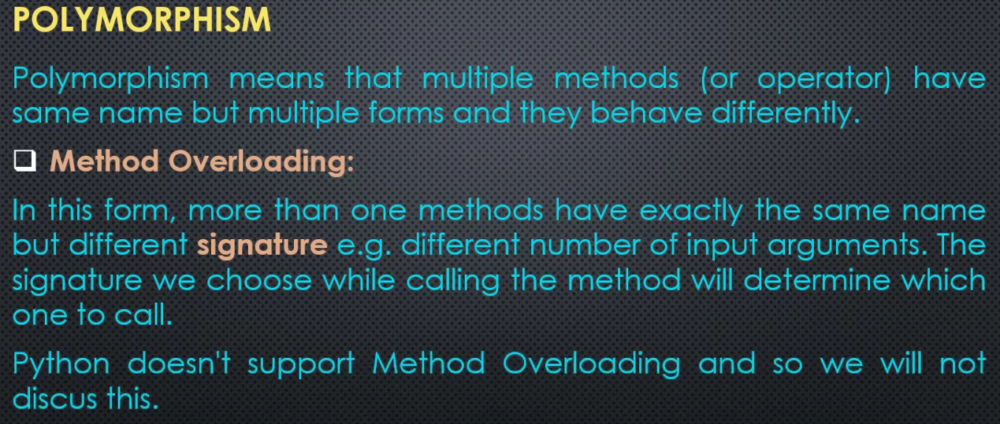

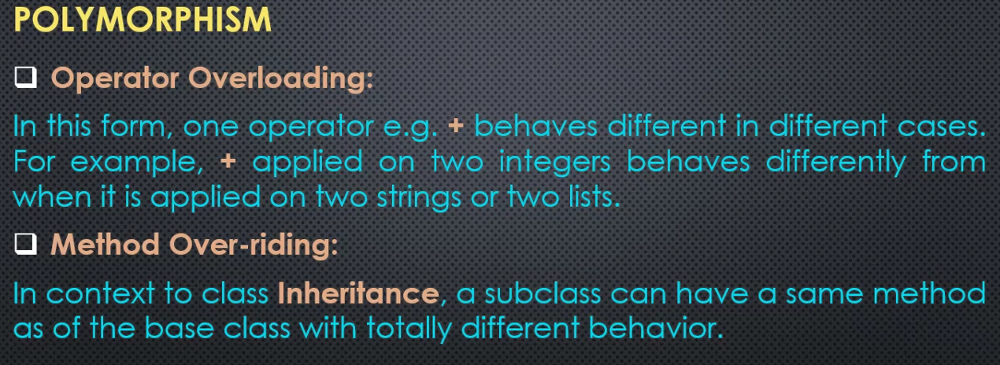

In [ ]:
# Polymorphic behaviour of + operator
a = 2+3
print(a)
a = '2'+'3'
print(a)
a = [2]+[3]
print(a)

5
23
[2, 3]


In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)
  def set_group_mem(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def drop_group_mem(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'


## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

stud1+stud2

TypeError: unsupported operand type(s) for +: 'Student' and 'Student'

In [ ]:
a = [2].__add__([3])

print(a)

[2, 3]


Python operator looks for the dunder add method inside the class whenever is + operator is applied.

In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)
  def set_group_mem(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def drop_group_mem(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    return list(set(self.courses + other.courses)) # set to remove duplicates



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(stud1 + stud2)

['Statistics', 'ML', 'DL', 'AI', 'Maths']

Let use a plus operator to form group members instead of listing courses:
copy setgroupmemeber to add dunder method and remove setgroupmember

In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  def drop_group_mem(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

stud1 + stud2
print(stud1.group_mem)

Ali-02


In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

stud1 + stud2
print(stud1.group_mem)
stud1 - stud2
print(stud1.group_mem)

Ali-02
None


In [ ]:
stud1 < stud2

TypeError: '<' not supported between instances of 'Student' and 'Student'

In [ ]:
print(Student.all_students)
print(Student.all_students.sort())

[Temesgen-01, Ali-02, Solomon-03, Nahom-04]


TypeError: '<' not supported between instances of 'Student' and 'Student'

In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self.courses) < len(other.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(stud1 < stud2)

True


In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self.courses) < len(other.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(stud1 < stud2) # with only __sub__ defined, we can use ">" (or define __gt__ methods)
print(stud1 > stud2)
print(Student.all_students)
Student.all_students.sort() # sorting based on number of courses
print(Student.all_students)
print(max(Student.all_students))
print(min(Student.all_students))

True
False
[Temesgen-01, Ali-02, Solomon-03, Nahom-04]
[Temesgen-01, Solomon-03, Ali-02, Nahom-04]
Nahom-04
Temesgen-01


In [ ]:
class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self.courses) < len(other.courses)
  def __eq__(self, other):
    # to compare number of courses
    return len(self.courses) == len(other.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(stud1 == stud2)

False


In [ ]:
print(stud1 <= stud2)

TypeError: '<=' not supported between instances of 'Student' and 'Student'

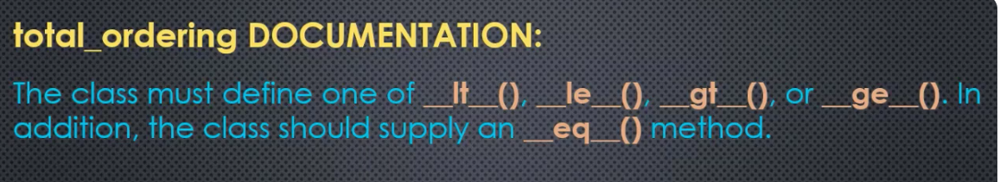

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self.courses) < len(other.courses)
  def __eq__(self, other):
    # to compare number of courses
    return len(self.courses) == len(other.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(stud1 <= stud2)

True


In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self.courses) < len(other.courses)
  def __eq__(self, other):
    # to compare number of courses
    return len(self.courses) == len(other.courses)

  def __len__(self):
    return len(self.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(len(stud1)) # Stat is added automatically.

3


Once we have len, we can used it in `__lt__`, `__eq__`.

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem != None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem != None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self) < len(other)
  def __eq__(self, other):
    # to compare number of courses
    return len(self) == len(other)

  def __len__(self):
    return len(self.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

print(stud1 < stud2)

True


In [ ]:
stud1 + stud2
stud1 + stud3 # this error is not the error we specified.

TypeError: object of type 'NoneType' has no len()

In [ ]:
a = [1, 2, 3]
b = [1, 2, 3]

print(a == b)
print(a is b) # to different objects in memory
print(id(a), id(b)) # to different objects in memory

True
False
138627439296384 138627440870208


In [ ]:
a=b=c=None
print(id(a), id(b), id(c), id(None)) # same id

97646771954656 97646771954656 97646771954656 97646771954656


In following code, we replaced `!= None` by is `not None`.

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem is not None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem is not None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem == None and other.group_mem == None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self) < len(other)
  def __eq__(self, other):
    # to compare number of courses
    return len(self) == len(other)

  def __len__(self):
    return len(self.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

stud1 + stud2
stud1 + stud3 # This is now our expected error.

ValueError: Temesgen-01 already has Ali-02 group.

for the same reason we change the == to is operator in __sub__ fuction

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem is not None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem is not None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem is None and other.group_mem is None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self) < len(other)
  def __eq__(self, other):
    # to compare number of courses
    return len(self) == len(other)

  def __len__(self):
    return len(self.courses)



## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

stud1 + stud2
print(stud1 - stud4) # This is now our expected error.

ValueError: Temesgen-01 is not a group member of Nahom-04.

Generally, better to use `is` than `==` incase of `None`
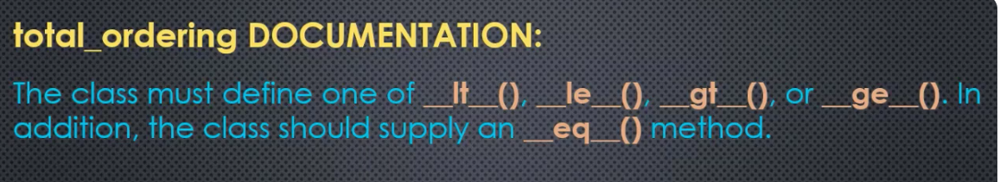

Making object iterable: if an object is iterable, we can directly apply equation on it.

In [ ]:
for i in stud2:
  print(i)

TypeError: 'Student' object is not iterable

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem is not None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem is not None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem is None and other.group_mem is None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self) < len(other)
  def __eq__(self, other):
    # to compare number of courses
    return len(self) == len(other)

  def __len__(self):
    return len(self.courses)

  def __iter__(self):
    yield self.first_name
    yield self.last_name
    yield self.reg_num
    yield self.courses





## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

for i in stud2:
  print(i)

Kedir
Ali
UG-0002
['Statistics', 'ML', 'Maths', 'DL']


Instead `yield`, we can use a `generator` expression

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem is not None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem is not None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem is None and other.group_mem is None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self) < len(other)
  def __eq__(self, other):
    # to compare number of courses
    return len(self) == len(other)

  def __len__(self):
    return len(self.courses)

  def __iter__(self):
    all_att = [self.first_name, self.last_name, self.reg_num, self.courses]
    # yield self.first_name
    # yield self.last_name
    # yield self.reg_num
    # yield self.courses
    return (att for att in all_att)

## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

for i in stud2:
  print(i)

Kedir
Ali
UG-0002
['Statistics', 'ML', 'Maths', 'DL']


If we want each course separately.

In [ ]:
from functools import total_ordering
@total_ordering

class Student:
  dept = "Data Science"
  offered_courses = ["AI", "DL", "ML", "Statistics", "Maths", "Programming", "Economics"]
  all_students = []
  def __init__(self, f_name, l_name, r_num):
    self.first_name = f_name
    self.last_name = l_name
    self.reg_num = r_num
    self.email = f"{self.first_name.lower()}.{self.last_name.lower()}@pukyong.ac.kr"
    self.courses = ["Statistics"]
    self.group_mem = None
    Student.all_students.append(self)

  @property
  def full_name(self):
    return f"{self.first_name} {self.last_name}"

  def __repr__(self):
    return f"{self.last_name}-{self.reg_num[-2: ]}" # last 2 disgits of reg_num

  def register_course(self, *subject):
    for course in subject:
      if course not in Student.offered_courses:
        raise ValueError(f"{course} is not offered.")
      if course in Student.offered_courses and course not in self.courses:
        self.courses.append(course)

  @classmethod
  def not_reg_courses(cls): #cls is a convension
      a = set()
      for stud in cls.all_students:
        s = set(stud.courses)
        a.update(s)
      return list(set(cls.offered_courses).difference(a))

  @classmethod
  def without_group_mem(cls):
    return list(filter(lambda s: s.group_mem == None, cls.all_students))

  ## Magic Methods ##
  def __repr__(self):
    return f'{self.last_name}-{self.reg_num[-2: ]}'
  def __add__(self, other):
    if self.group_mem is not None:
      raise ValueError(f"{self} already has {self.group_mem} group.")
    elif other.group_mem is not None:
      raise ValueError(f"{other} already has {other.group_mem} group.")
    else:
      self.group_mem = other
      other.group_mem = self

  def __sub__(self, other):
    if self.group_mem is None and other.group_mem is None:
      return
    elif self.group_mem != other:
      raise ValueError(f"{self} is not a group member of {other}.")
    else:
      self.group_mem = None
      other.group_mem = None

  def __lt__(self, other):
    # to compare number of courses
    return len(self) < len(other)
  def __eq__(self, other):
    # to compare number of courses
    return len(self) == len(other)

  def __len__(self):
    return len(self.courses)

  def __iter__(self):
    yield self.first_name
    yield self.last_name
    yield self.reg_num
    for c in self.courses:
      yield c

## Main Program ##
stud1 = Student("Solomon", "Temesgen", "UG-0001")
stud2 = Student("Kedir", "Ali", "UG-0002")
stud3 = Student("Almaz", "Solomon", "UG-0003")
stud4 = Student("Elsa", "Nahom", "UG-0004")

stud1.register_course("AI", "DL")
stud2.register_course("ML", "Maths", "DL")
stud3.register_course("Programming", "Economics")
stud4.register_course("ML", "Economics", "DL", "Maths")

for i in stud2:
  print(i)

Kedir
Ali
UG-0002
Statistics
ML
Maths
DL


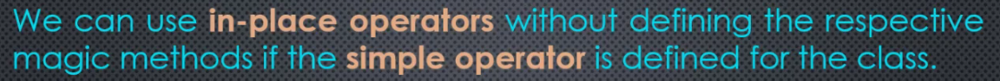

## **NotImplemented and Reflection Function**

In [ ]:
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y
  def __str__(self):
    return f"({self.x}, {self.y})"
  def __mul__(self, num):
    return Point(self.x * num, self.y * num)

## Main Program ##
p1 = Point(-2, 4)
p2 = p1 * 3
print(p2)

(-6, 12)


Our dunder function defines multiplication between a point and a number. But, it fails to multiply a number and a point.

In [ ]:
p2 = 3 * p1
print(p2)

TypeError: unsupported operand type(s) for *: 'int' and 'Point'

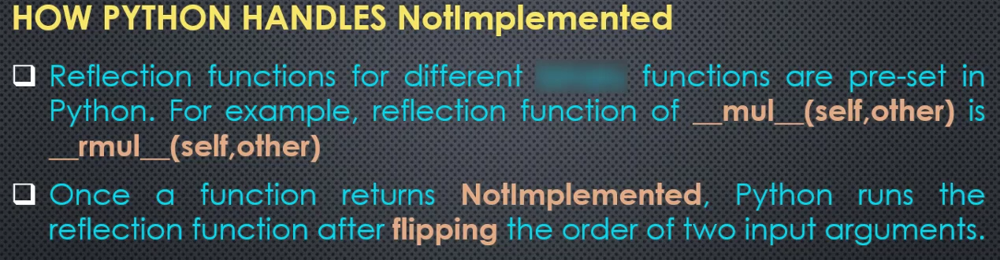

In [ ]:
p2 = 3 * p1 # This excecutes 3.__mul__(p1) --> applied on an integer, not the object of our class
# 3.__mul__(p1) --> int class --> NotImplemented --> p1.__rmul__(3) --> Point Class


In [ ]:
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y
  def __str__(self):
    return f"({self.x}, {self.y})"
  def __mul__(self, num):
    return Point(self.x * num, self.y * num)
  def __rmul__(self, num):
    return Point(self.x * num, self.y * num) # Tutorial says not good idea

## Main Program ##
p1 = Point(-2, 4)
p2 = 3 * p1
print(p2)

(-6, 12)


In [ ]:
import math
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y
  def __str__(self):
    return f"({self.x}, {self.y})"
  def __mul__(self, num):
    return Point(self.x * num, self.y * num)
  def __rmul__(self, num):
    return self * num # there is also a better method

## Main Program ##
p1 = Point(-2, 4)
p2 = 3 * p1
print(p2)

(-6, 12)


In [ ]:
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y
  def __str__(self):
    return f"({self.x}, {self.y})"
  def __mul__(self, num):
    return Point(self.x * num, self.y * num)
  __rmul__ = __mul__

## Main Program ##
p1 = Point(-2, 4)
p2 = 3 * p1
print(p2)

(-6, 12)


In [ ]:
from math import sqrt
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y
  def __str__(self):
    return f"({self.x}, {self.y})"
  def __mul__(self, num):
    return Point(self.x * num, self.y * num)
  __rmul__ = __mul__
  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __gt__(self, other):
    return abs(self) > abs(other)




## Main Program ##
p1 = Point(-2, 4)
p2 = 3 * p1
print(p2 > p1)
print(p1 < p2) # correct result even we do not have < function
#p2 < p1 --> p2.__lt__(p1) --> builtins.object --> NotImplemented
#p1.__gt__(p2)

True


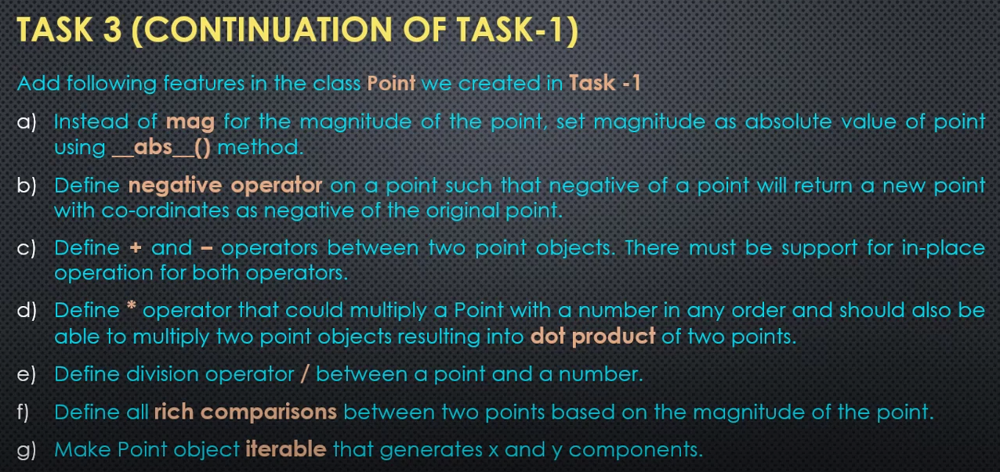

In [ ]:
import math
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  @property
  def mag(self):
    return math.sqrt(self.x**2 + self.y**2)

  def show_point(self):
    return (f"({self.x}, {self.y})")


In [ ]:
from math import sqrt
from numbers import Real
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")
  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  @property
  def mag(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")


# p1 = Point("4",5)
p2 = Point(3,'-4')

TypeError: y coordinate must be a number.

Task 3 and 4

In [ ]:
from math import sqrt
from numbers import Real
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")


p1 = Point(4,5)
p2 = Point(1,2)
print(abs(p1))
p1.reset()
print(abs(p1))

6.4031242374328485
0.0


In [ ]:
from math import sqrt
from numbers import Real
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")

  def __neg__(self):
    return Point(-self.x, -self.y)


p1 = Point(4,5)
p2 = Point(1,2)
print(p1, -p1)

(4, 5) (-4, -5)


In [ ]:
from math import sqrt
from numbers import Real
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")

  def __neg__(self):
    return Point(-self.x, -self.y)

  def __add__(self, other):
    return Point(self.x + other.x, self.y + other.y)


p1 = Point(4,5)
p2 = Point(1,2)
p1 +=p2
print(p1)

(5, 7)


In [ ]:
from math import sqrt
from numbers import Real
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")

  def __neg__(self):
    return Point(-self.x, -self.y)

  def __add__(self, other):
    return Point(self.x + other.x, self.y + other.y)

  def __sub__(self, other):
    # return Point(self.x - other.x, self.y - other.y)
    return self + (-other)

  def __mul__(self, other):
    if isinstance(other, Real):
      return Point(self.x * other, self.y * other)
    if isinstance(other, Point):
      return self.x * other.x + self.y * other.y
  __rmul__ = __mul__


p1 = Point(4,5)
p2 = Point(1,2)
print(p1 * p2)
p1 *=2
print(p1)
print(2*p1)

14
(8, 10)
(16, 20)


In [ ]:
from math import sqrt
from numbers import Real
class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")

  def __neg__(self):
    return Point(-self.x, -self.y)

  def __add__(self, other):
    return Point(self.x + other.x, self.y + other.y)

  def __sub__(self, other):
    # return Point(self.x - other.x, self.y - other.y)
    return self + (-other)

  def __mul__(self, other):
    if isinstance(other, Real):
      return Point(self.x * other, self.y * other)
    if isinstance(other, Point):
      return self.x * other.x + self.y * other.y
  __rmul__ = __mul__

  def __truediv__(self, num):
    return self * (1/num)

p1 = Point(4,5)
p2 = Point(1,2)
p1 /= 2
print(p1)

(2.0, 2.5)


In [ ]:
from math import sqrt
from numbers import Real
from functools import total_ordering
@total_ordering

class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")

  def __neg__(self):
    return Point(-self.x, -self.y)

  def __add__(self, other):
    return Point(self.x + other.x, self.y + other.y)

  def __sub__(self, other):
    # return Point(self.x - other.x, self.y - other.y)
    return self + (-other)

  def __mul__(self, other):
    if isinstance(other, Real):
      return Point(self.x * other, self.y * other)
    if isinstance(other, Point):
      return self.x * other.x + self.y * other.y
  __rmul__ = __mul__

  def __truediv__(self, num):
    return self * (1/num)

  # rich comparisons
  def __eq__(self, other):
    return abs(self) == abs(other)
  def __lt__(self, other):
    return abs(self) < abs(other)

p1 = Point(4,5)
p2 = Point(1,2)
print(p1 == p2)
print(p1 > p2)

False
True


In [ ]:
from math import sqrt
from numbers import Real
from functools import total_ordering
@total_ordering

class Point:
  def __init__(self, x = 0, y = 0):
    self.x = x
    self.y = y

  @property
  def x(self):
    return self._x
  @x.setter
  def x(self, newx):
    if isinstance(newx, Real):
      self._x = newx
    else:
      raise TypeError("x coordinate must be a number.")

  @property
  def y(self):
    return self._y
  @y.setter
  def y(self, newy):
    if isinstance(newy, Real):
      self._y = newy
    else:
      raise TypeError("y coordinate must be a number.")

  def reset(self):
    self.move(0, 0)

  def move(self, x, y):
    self.x = x
    self.y = y

  def move_x(self, x):
    self.x = x

  def move_y(self, y):
    self.y = y

  def __abs__(self):
    return sqrt(self.x**2 + self.y**2)

  def __repr__(self):
    return (f"({self.x}, {self.y})")

  def __neg__(self):
    return Point(-self.x, -self.y)

  def __add__(self, other):
    return Point(self.x + other.x, self.y + other.y)

  def __sub__(self, other):
    # return Point(self.x - other.x, self.y - other.y)
    return self + (-other)

  def __mul__(self, other):
    if isinstance(other, Real):
      return Point(self.x * other, self.y * other)
    if isinstance(other, Point):
      return self.x * other.x + self.y * other.y
  __rmul__ = __mul__

  def __truediv__(self, num):
    return self * (1/num)

  # rich comparisons
  def __eq__(self, other):
    return abs(self) == abs(other)
  def __lt__(self, other):
    return abs(self) < abs(other)
  def __iter__(self):
    yield self.x
    yield self.y


p1 = Point(4,5)
p2 = Point(1,2)
for i in p1:
  print(i)

4
5


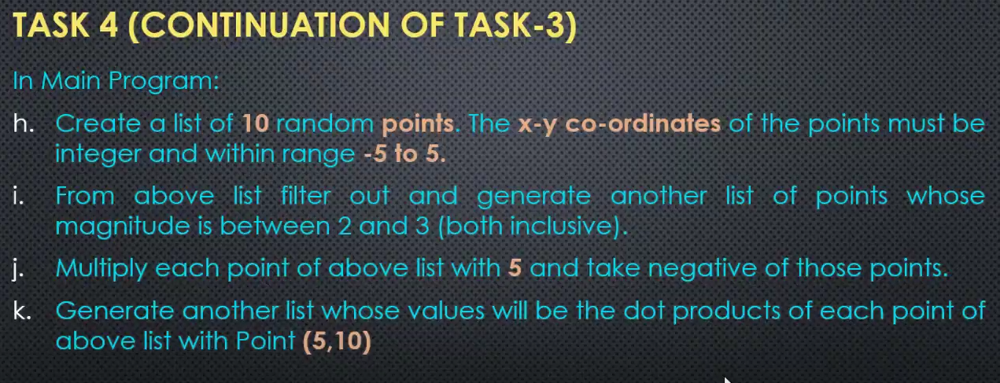

In [ ]:
from random import randint

l = [Point(randint(-5,5), randint(-5,5)) for i in range(10)]
print(l)

ring_points = list(filter(lambda p: 2<= abs(p) <= 3, l))
print(ring_points)
big_ring_points = [p* -5 for p in ring_points]
print(big_ring_points)
p1 = Point(5, 10)
new_list = [p1 * p for p in big_ring_points]
print(new_list)

[(-2, 3), (-1, -1), (0, -4), (4, 5), (0, -3), (-3, 1), (-3, -1), (2, -1), (2, -4), (-2, -1)]
[(0, -3), (2, -1), (-2, -1)]
[(0, 15), (-10, 5), (10, 5)]
[150, 0, 100]
